Let's start by importing all the required libraries



Good Practice Coding Note: Try to keep all the import statements at the top and we only import once and we can use them how many every times we want 



In [3]:
showGraphs = True
import plotly.figure_factory as ff
import pandas as pd
import numpy as np
import plotly.express as px
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.metrics import confusion_matrix
from sklearn import linear_model
from sklearn import svm
from sklearn import tree
import seaborn as sns
import math
import plotly.graph_objects as go
pd.options.plotting.backend = 'plotly'

In [4]:
df = pd.read_csv("Merged_dataset.csv")

#Lets Clean data


In [5]:
df.dropna(axis=1, inplace=True)
df = df.reset_index(drop=True)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45730 entries, 0 to 45729
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   mass_npea       45730 non-null  float64
 1   size_npear      45730 non-null  float64
 2   malign_ratio    45730 non-null  float64
 3   damage_size     45730 non-null  float64
 4   exposed_area    45730 non-null  float64
 5   std_dev_malign  45730 non-null  float64
 6   err_malign      45730 non-null  float64
 7   malign_penalty  45730 non-null  int64  
 8   damage_ratio    45730 non-null  float64
 9   tumor_size      45730 non-null  float64
dtypes: float64(9), int64(1)
memory usage: 3.5 MB


Lets start exploring and understanding our data



In [7]:
df.head()

,mass_npea,size_npear,malign_ratio,damage_size,exposed_area,std_dev_malign,err_malign,malign_penalty,damage_ratio,tumor_size
0,6930.90,2919.02,0.42116,51.8298,9.888294e+05,109.487,2758.76,72,39.3620,14.103
1,15635.70,4879.36,0.31206,223.5500,2.058426e+06,248.881,5952.53,240,22.0253,2.648
2,10376.20,2613.88,0.25191,127.3370,1.434676e+06,160.093,4635.26,73,29.9963,1.688
3,13093.80,4510.06,0.34444,155.4400,1.812195e+06,173.015,5273.87,32,28.1354,3.796
4,7545.21,2882.36,0.38201,85.1237,1.043918e+06,124.414,3263.35,57,35.0200,18.023


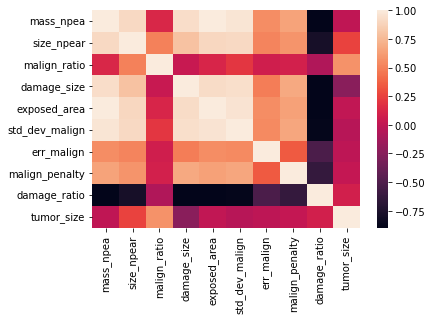

In [8]:
if showGraphs:
    sns.heatmap(df.corr())

In [9]:
len(df.index)

45730

In [10]:
df.columns

Index(['mass_npea', 'size_npear', 'malign_ratio', 'damage_size',
       'exposed_area', 'std_dev_malign', 'err_malign', 'malign_penalty',
       'damage_ratio', 'tumor_size'],
      dtype='object')

Make sure to check if there are any null values

In [11]:
df.isnull()

,mass_npea,size_npear,malign_ratio,damage_size,exposed_area,std_dev_malign,err_malign,malign_penalty,damage_ratio,tumor_size
0,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...
45725,False,False,False,False,False,False,False,False,False,False
45726,False,False,False,False,False,False,False,False,False,False
45727,False,False,False,False,False,False,False,False,False,False
45728,False,False,False,False,False,False,False,False,False,False


In [10]:
df.tail()

,mass_npea,size_npear,malign_ratio,damage_size,exposed_area,std_dev_malign,err_malign,malign_penalty,damage_ratio,tumor_size
45725,16301.90,4967.74,0.30473,210.0270,2.130257e+06,267.5270,6307.85,254,21.6586,6.980089
45726,8111.15,1910.59,0.23555,70.8298,1.149657e+06,88.9296,3051.35,63,39.0947,7.591675
45727,13554.10,3963.33,0.29240,144.6260,1.815171e+06,201.7690,4781.60,56,30.8800,7.315385
45728,5764.68,1117.16,0.19379,54.9415,7.784623e+05,73.3862,2505.60,27,41.0372,4.724118
45729,4419.05,840.74,0.19025,45.5905,5.966973e+05,65.1221,2588.04,11,46.5464,3.169346


Lets start making some amazing plots



In [12]:
if showGraphs:
    fig = px.scatter_matrix(df, title= "Scatter Matrix of Melanoma Dataset", color= "tumor_size", height=1200, width= 1600, color_continuous_scale=px.colors.diverging.Tealrose)
    fig.update_traces(diagonal_visible=False, showupperhalf=False)
    fig.show()

In [12]:
if showGraphs:
    fig = px.scatter(df, x='malign_ratio', y='tumor_size')
    fig.show()

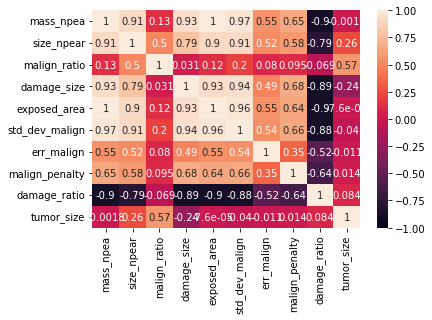

In [13]:
if showGraphs:
    sns.heatmap(df.corr(), vmin=-1, vmax=1, annot=True)

Lets get ready for Machine Learning 



In [14]:
target= df['tumor_size']
input_columns= df.loc[:, df.columns != 'tumor_size']


Lets split our data into training and testing

In [22]:
x_train, x_test, y_train, y_test = train_test_split(input_columns, target, train_size=0.8)

In [16]:
print(x_test) #checking if this was 20%-- it is

       mass_npea  size_npear  malign_ratio  damage_size  exposed_area  \
19167   10139.10     3305.87       0.32605      94.0739  1.370495e+06   
37708   11024.50     2630.54       0.23860     108.9660  1.597310e+06   
3149     6907.49     2438.91       0.35308      40.2037  9.236241e+05   
12404    8871.19     3252.34       0.36661      93.3118  1.269218e+06   
1827    16336.60     4003.97       0.24509     220.5310  2.292613e+06   
...          ...         ...           ...          ...           ...   
2896     9651.51     2526.73       0.26179      93.7132  1.367874e+06   
43400    7029.26     1985.73       0.28249      63.4257  9.612102e+05   
23924    7720.85     1997.36       0.25869      65.7720  1.121381e+06   
26317    7695.30     1919.74       0.24946      56.0469  1.087313e+06   
9817    17874.30     5081.24       0.28427     230.0100  2.464349e+06   

       std_dev_malign  err_malign  malign_penalty  damage_ratio  
19167        137.2110     4727.86              53       3

Machine Learning Begins



In [17]:
MSE_list= []
RMSE_list=[]
MAE_list=[]

In [0]:
#KNN w/ n=7
mlModel = KNN(n_neighbors=7)
mlModel.fit(x_train, y_train)
y_hat = mlModel.predict(x_test)

# Percentage of correct (or close to correct) predictions
print(np.mean(np.abs((y_hat - y_test)/y_hat))*100) 

#Mean squared error
TSE= (np.sum((y_test-y_hat)**2))
MSE= TSE/len(y_test)
print("MSE=", MSE)
MSE_list.append(MSE)

#Root mean squared error
RMSE= math.sqrt(MSE)
print("RMSE=", RMSE) 
RMSE_list.append(RMSE)

#Mean Absolute Error (MAE)
MAE= np.mean(np.abs(y_hat - y_test))
print("MAE=", MAE)
MAE_list.append(MAE)


In [19]:
#KNN w/ n=95
mlModel = KNN(n_neighbors=95)
mlModel.fit(x_train, y_train)
y_hat = mlModel.predict(x_test)

# Percentage of correct (or close to correct) predictions
print(np.mean(np.abs((y_hat - y_test)/y_hat))*100) 

#Mean squared error
TSE= (np.sum((y_test-y_hat)**2))
MSE= TSE/len(y_test)
print("MSE=", MSE) 
MSE_list.append(MSE)

#Root mean squared error
RMSE= math.sqrt(MSE)
print("RMSE=", RMSE) 
RMSE_list.append(RMSE)

#Mean Absolute Error (MAE)
MAE= np.mean(np.abs(y_hat - y_test))
print("MAE=", MAE)
MAE_list.append(MAE)


39.34890926415149
MSE= 14.869220796917864
RMSE= 3.856062862158482
MAE= 2.9541032875112823


In [21]:
#Support Vector Regression
regr = svm.SVR()
regr.fit(x_train, y_train)
y_hat= regr.predict(x_test)

# Percentage of correct (or close to correct) predictions
print(np.mean(np.abs((y_hat - y_test)/y_hat))*100) 

#Mean squared error
TSE= (np.sum((y_test-y_hat)**2))
MSE= TSE/len(y_test)
print("MSE=", MSE) 
MSE_list.append(MSE)

#Root mean squared error
RMSE= math.sqrt(MSE)
print("RMSE=", RMSE) 
RMSE_list.append(RMSE)

#Mean Absolute Error (MAE)
MAE= np.mean(np.abs(y_hat - y_test))
print("MAE=", MAE)
MAE_list.append(MAE)


NameError: name 'array' is not defined

In [13]:
#Decision Tree
clf = tree.DecisionTreeRegressor()
clf = clf.fit(x_train, y_train)
y_hat= clf.predict(x_test)

# Percentage of correct (or close to correct) predictions
print(np.mean(np.abs((y_hat - y_test)/y_hat))*100) 

#Mean squared error
TSE= (np.sum((y_test-y_hat)**2))
MSE= TSE/len(y_test)
print("MSE=", MSE) 
MSE_list.append(MSE)

#Root mean squared error
RMSE= math.sqrt(MSE)
print("RMSE=", RMSE) 
RMSE_list.append(RMSE)

#Mean Absolute Error (MAE)
MAE= np.mean(np.abs(y_hat - y_test))
print("MAE=", MAE) #inf= infinity??
MAE_list.append(MAE)


NameError: name 'x_train' is not defined

In [14]:
#Linear ridge regression
clf = linear_model.Ridge(alpha=.5)
clf.fit(x_train, y_train)
y_hat= clf.predict(x_test)

# Percentage of correct (or close to correct) predictions
print(np.mean(np.abs((y_hat - y_test)/y_hat))*100) 

#Mean squared error
TSE= (np.sum((y_test-y_hat)**2))
MSE= TSE/len(y_test)
print("MSE=", MSE) 
MSE_list.append(MSE)

#Root mean squared error
RMSE= math.sqrt(MSE)
print("RMSE=", RMSE) 
RMSE_list.append(RMSE)

#Mean Absolute Error (MAE)
MAE= np.mean(np.abs(y_hat - y_test))
print("MAE=", MAE)
MAE_list.append(MAE)


NameError: name 'x_train' is not defined

In [0]:
print(MSE_list)
print(RMSE_list)
print(MAE_list)

Lets make some amazing plots talking about our models 



In [0]:
#sns.heatmap(confusion_matrix(y_test, y_hat), annot=True, fmt='g') #there would be a different graph for regression right? for regression you just use the numerical values- MAE, MSE, RMSE

In [1]:
if showGraphs:
    fig = px.density_heatmap(df, x="malign_ratio", y="tumor_size", color_continuous_scale="Viridis")
    fig.show()

NameError: name 'showGraphs' is not defined

In [15]:
if showGraphs:
    fig = px.violin(df, y="damage_size")
    fig.show()

In [16]:
if showGraphs:
    fig = px.scatter_3d(df, x='mass_npea', y='malign_ratio', z='exposed_area', color='size_npear')
    fig.show()

In [17]:
if showGraphs:
    fig = px.parallel_coordinates(df, color="tumor_size", labels={"mass_npea", "size_npear", "malign_ratio", "damage_size", "exposed_area", "std_dev_malign", "err_malign", "malign_penalty", "damage_ratio", "tumor_size"},
                    color_continuous_scale=px.colors.diverging.Tealrose_r)
    fig.show()

In [18]:
if showGraphs:
    fig = px.density_contour(df, x="tumor_size", y="damage_size")
    fig.update_traces(contours_coloring="fill", contours_showlabels = True,colorscale='Inferno')
    fig.show()

In [0]:
# df = df
# fig = px.funnel(df, x='tumor_size', y='damage_size')
# fig.show()